In [1]:
from matplotlib.animation import FuncAnimation
import matplotlib.pyplot as plt
from IPython.display import HTML
import seaborn as sns
import pandas as pd
import numpy as np


In [2]:
# Load the player data
players_df = pd.read_csv("D:\Personal\G-Project\Padelytics\output\datasets\players_data.csv")
players_df.rename(columns={"frame": "Frame"}, inplace=True)
players = ["player1", "player2", "player3", "player4"]
players_data = players_df.copy()


In [3]:
# Load the ball data
ball_df = pd.read_csv("D:/Personal/G-Project/Padelytics/output/datasets/ball_data.csv")
ball_df.rename(columns={"frame": "Frame"}, inplace=True)

# Copy to data for further analysis
ball_data = ball_df.copy()


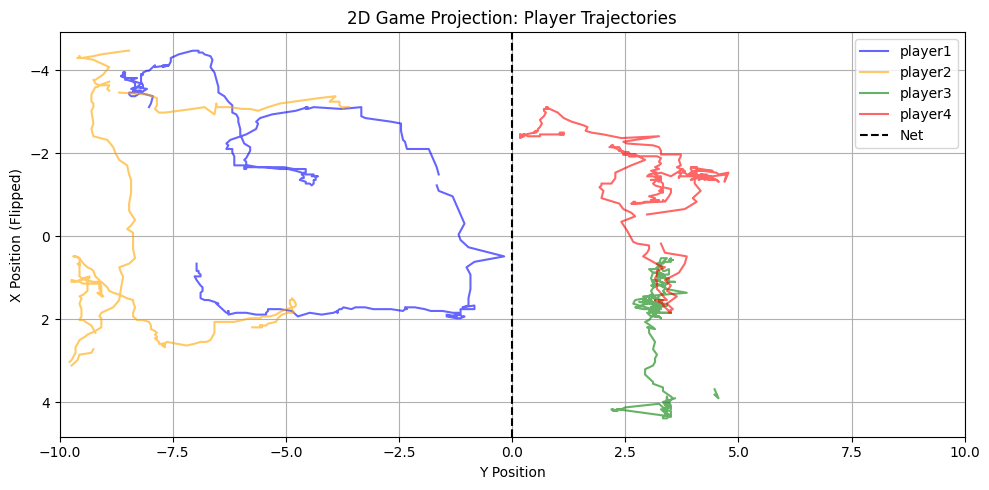

In [4]:
# Flip Y for correct top-down view
for player in players:
    players_data[f'{player}_y'] = -players_data[f'{player}_y']

# Static plot for player trajectories
plt.figure(figsize=(10, 5))
colors = ['blue', 'orange', 'green', 'red']
for player, color in zip(players, colors):
    plt.plot(players_data[f'{player}_y'], players_data[f'{player}_x'], label=f'{player}', alpha=0.6, color=color)
plt.axvline(0, color='black', linestyle='--', label='Net')
plt.ylabel('X Position (Flipped)')
plt.xlabel('Y Position')
plt.title("2D Game Projection: Player Trajectories")
plt.gca().invert_yaxis()
plt.xlim(-10, 10)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [5]:
# Animated plot
fig, ax = plt.subplots(figsize=(10, 5))
ax.axvline(0, color='black', linestyle='--', label='Net')
ax.set_ylabel('X Position (Flipped)')
ax.set_xlabel('Y Position')
ax.set_title('Animated Player Movement')
ax.grid(True)

# Axis limits
ax.set_xlim(-10, 10)
y_min = players_data[[f'{p}_x' for p in players]].min().min()
y_max = players_data[[f'{p}_x' for p in players]].max().max()
ax.set_ylim(y_min - 1, y_max + 1)
ax.invert_yaxis()

# Scatter plot setup
scatters = {
    player: ax.scatter([], [], label=player.capitalize(), color=color, s=100)
    for player, color in zip(players, colors)
}
ax.legend()

# Update function for animation
def update(frame):
    for player in players:
        y = players_data[f'{player}_y'].iloc[frame]
        x = players_data[f'{player}_x'].iloc[frame]
        scatters[player].set_offsets([y, x])
    return scatters.values()

# Create animation
ani = FuncAnimation(fig, update, frames=len(players_data), interval=40, blit=True)
plt.close(fig)
HTML(ani.to_jshtml())


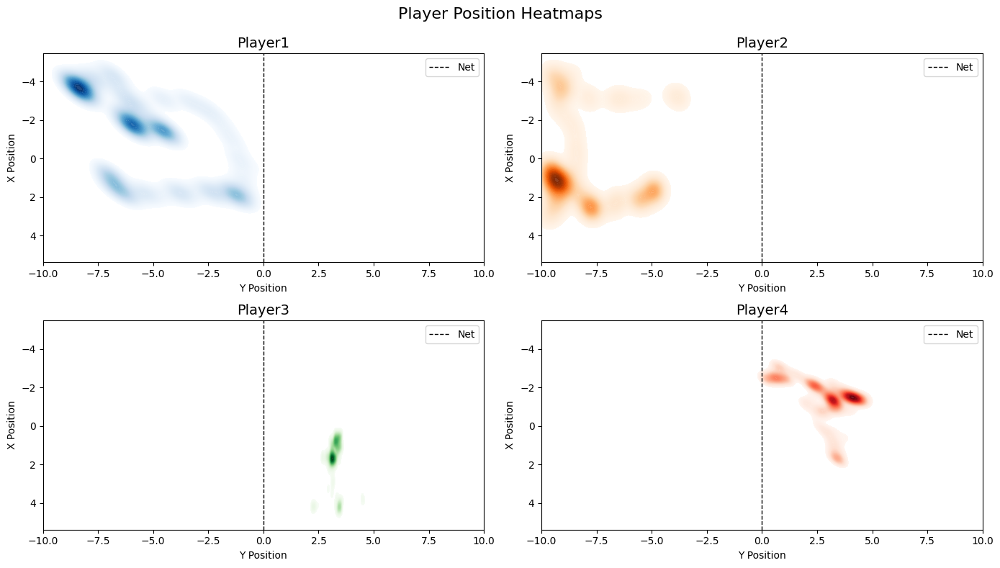

In [7]:
# Flip Y for top-down view
for player in players:
    players_data[f'{player}_y'] = -players_data[f'{player}_y']

colormaps = {
    "player1": "Blues",
    "player2": "Oranges",
    "player3": "Greens",
    "player4": "Reds",
}

fig, axes = plt.subplots(2, 2, figsize=(14, 8))
fig.suptitle('Player Position Heatmaps', fontsize=16)

x_min, x_max = -10, 10
y_min = players_data[[f"{p}_x" for p in players]].min().min()
y_max = players_data[[f"{p}_x" for p in players]].max().max()

for i, player in enumerate(players):
    ax = axes[i // 2, i % 2]
    cmap = colormaps[player]
    
    sns.kdeplot(
        x=players_data[f'{player}_y'],
        y=players_data[f'{player}_x'],
        fill=True,
        cmap=cmap,
        ax=ax,
        bw_adjust=0.5,
        thresh=0.05,
        levels=100,
        alpha=0.9,
    )

    ax.axvline(0, color='black', linestyle='--', linewidth=1, label='Net')
    ax.set_title(player.capitalize(), fontsize=14)
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min - 1, y_max + 1)
    ax.set_xlabel('Y Position')
    ax.set_ylabel('X Position')
    ax.invert_yaxis()
    ax.legend()

plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()



Total Distance Covered Analysis
player1: 35.93 meters
player2: 32.83 meters
player3: 29.70 meters
player4: 37.43 meters


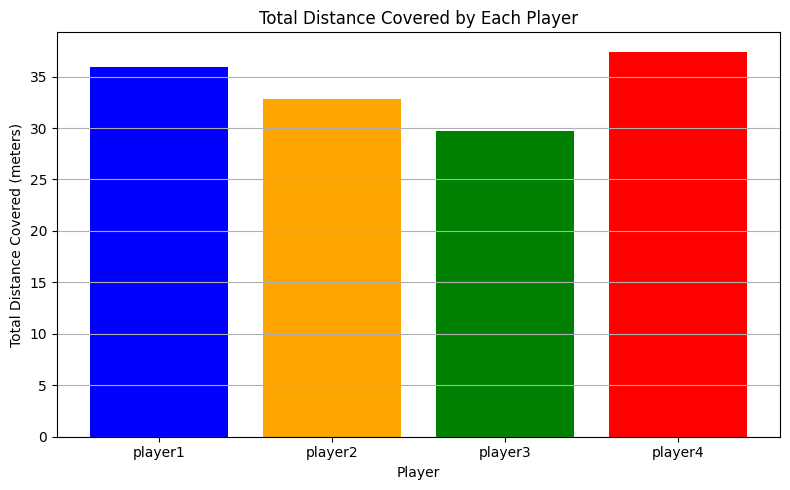

In [8]:
colors = ['blue', 'orange', 'green', 'red']

# Flip Y (if not already flipped)
for player in players:
    players_data[f'{player}_y'] = -players_data[f'{player}_y']

# Total Distance Covered
print("\nTotal Distance Covered Analysis")

total_distances = {}
for player in players:
    total = players_data[f'{player}_distance'].sum()
    total_distances[player] = total
    print(f"{player}: {total:.2f} meters")

# Bar Plot
plt.figure(figsize=(8, 5))
plt.bar(total_distances.keys(), total_distances.values(), color=colors)
plt.xlabel("Player")
plt.ylabel("Total Distance Covered (meters)")
plt.title("Total Distance Covered by Each Player")
plt.grid(axis='y')
plt.tight_layout()
plt.show()



Average Distance per Frame
player1: 0.11 meters/frame
player2: 0.11 meters/frame
player3: 0.09 meters/frame
player4: 0.12 meters/frame


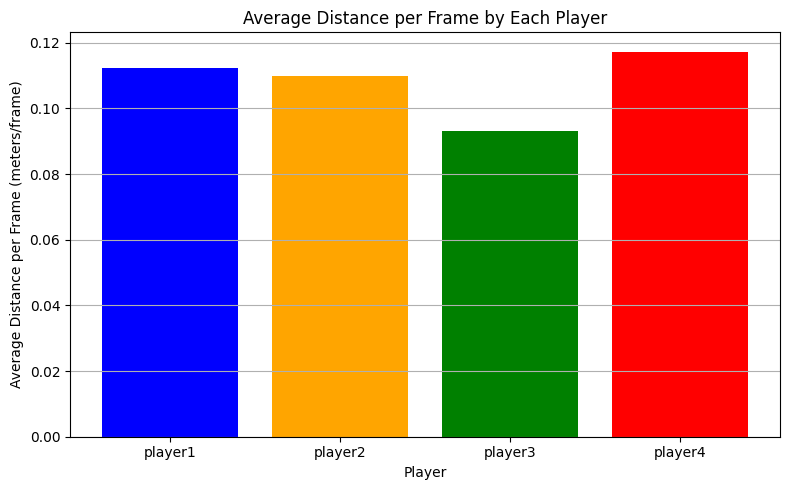

In [9]:
colors = ['blue', 'orange', 'green', 'red']

# Flip Y (if not already flipped)
for player in players:
    players_data[f'{player}_y'] = -players_data[f'{player}_y']

# Average Distance per Frame
print("\nAverage Distance per Frame")

average_distances = {}
for player in players:
    avg = players_data[f'{player}_distance'].mean()
    average_distances[player] = avg
    print(f"{player}: {avg:.2f} meters/frame")

# Bar Plot for Averages
plt.figure(figsize=(8, 5))
plt.bar(average_distances.keys(), average_distances.values(), color=colors)
plt.xlabel("Player")
plt.ylabel("Average Distance per Frame (meters/frame)")
plt.title("Average Distance per Frame by Each Player")
plt.grid(axis='y')
plt.tight_layout()
plt.show()


Average Speed (units/s):
player1: 2.81
player2: 2.75
player3: 2.33
player4: 2.93


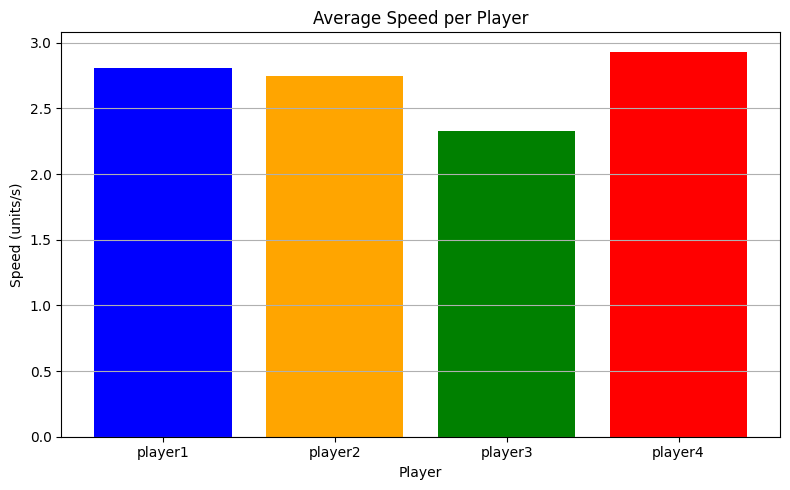

In [10]:
avg_speeds = [players_data[f'{player}_Vnorm1'].mean() for player in players]

print("Average Speed (units/s):")
for player, val in zip(players, avg_speeds):
    print(f"{player}: {val:.2f}")

plt.figure(figsize=(8, 5))
plt.bar(players, avg_speeds, color = ['blue', 'orange', 'green', 'red'])
plt.title('Average Speed per Player')
plt.ylabel('Speed (units/s)')
plt.xlabel('Player')
plt.grid(axis='y')
plt.tight_layout()
plt.show()



Max Speed (units/s):
player1: 20.48
player2: 22.18
player3: 29.93
player4: 21.09


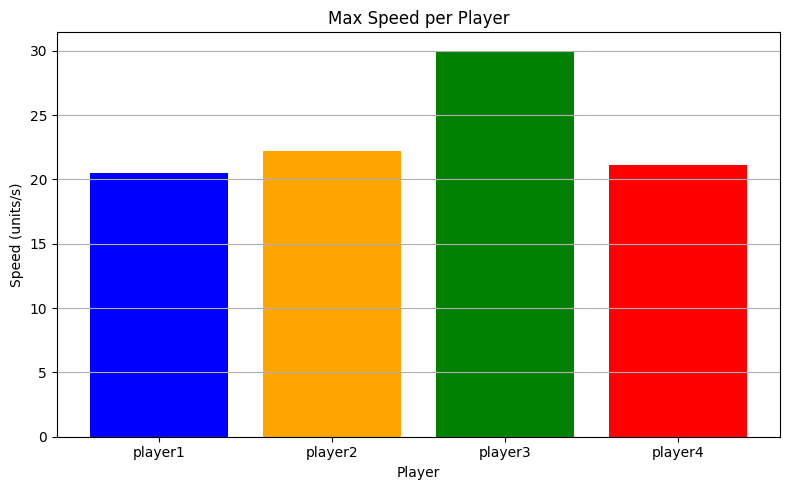

In [11]:
max_speeds = [players_data[f'{player}_Vnorm1'].max() for player in players]

print("\nMax Speed (units/s):")
for player, val in zip(players, max_speeds):
    print(f"{player}: {val:.2f}")

plt.figure(figsize=(8, 5))
plt.bar(players, max_speeds, color = ['blue', 'orange', 'green', 'red'])
plt.title('Max Speed per Player')
plt.ylabel('Speed (units/s)')
plt.xlabel('Player')
plt.grid(axis='y')
plt.tight_layout()
plt.show()



Average Acceleration (units/s²):
player1: 70.96
player2: 60.66
player3: 85.23
player4: 93.05


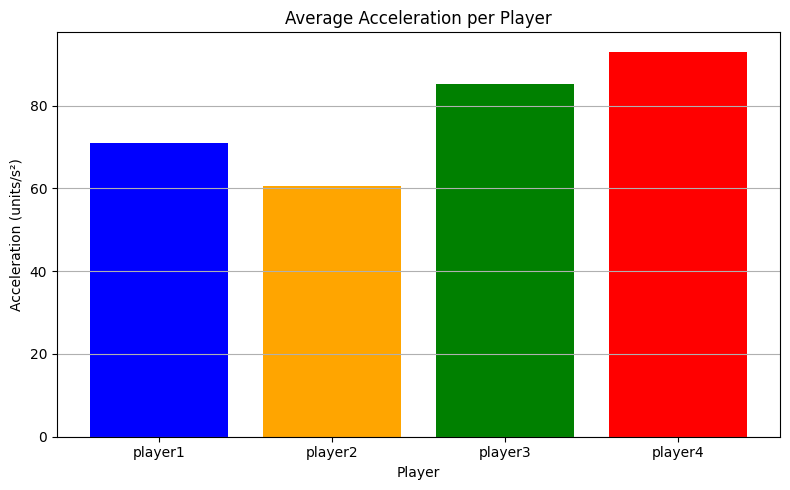

In [12]:
avg_accelerations = [players_data[f'{player}_Anorm1'].mean() for player in players]

print("\nAverage Acceleration (units/s²):")
for player, val in zip(players, avg_accelerations):
    print(f"{player}: {val:.2f}")

plt.figure(figsize=(8, 5))
plt.bar(players, avg_accelerations, color = ['blue', 'orange', 'green', 'red'])
plt.title('Average Acceleration per Player')
plt.ylabel('Acceleration (units/s²)')
plt.xlabel('Player')
plt.grid(axis='y')
plt.tight_layout()
plt.show()


Percentage of Time Each Player Spent in Zones:

player1 - Attack Zone: 38.08%
player1 - Defense Zone: 61.61%
player2 - Attack Zone: 9.29%
player2 - Defense Zone: 85.45%
player3 - Attack Zone: 99.38%
player3 - Defense Zone: 0.00%
player4 - Attack Zone: 99.38%
player4 - Defense Zone: 0.00%


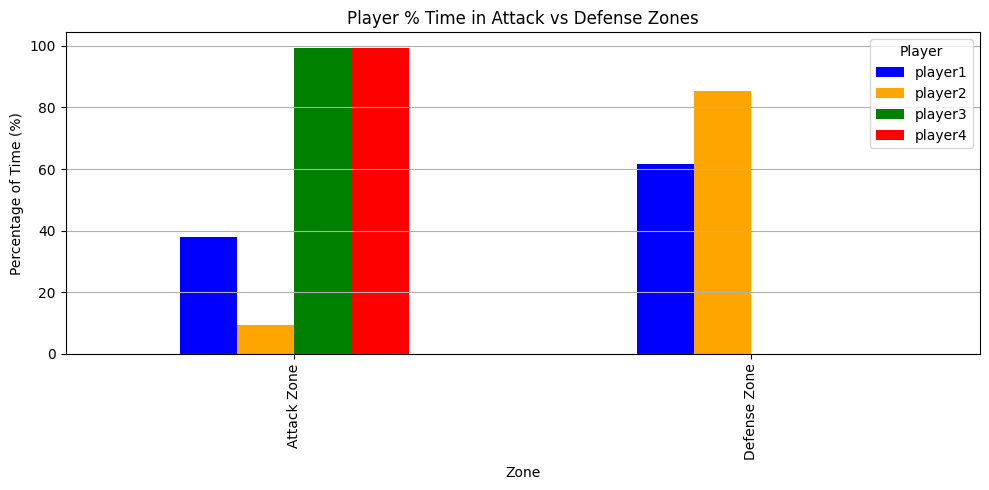

In [13]:
# Define the attack and defense zones based on the Y-axis
zones = {
    "Attack Zone": lambda y: (y >= -5) & (y <= 5),
    "Defense Zone": lambda y: (y < -5) | (y > 5),
}

# Prepare the calculation
zone_percentages = {zone: {player: 0 for player in players} for zone in zones}

# Calculate the percentage of time each player spent in each zone
print("Percentage of Time Each Player Spent in Zones:\n")
for player in players:
    y_positions = players_data[f'{player}_y']
    total_frames = len(y_positions)
    
    for zone_name, condition in zones.items():
        count = condition(y_positions).sum()
        percentage = (count / total_frames) * 100
        zone_percentages[zone_name][player] = percentage
        print(f"{player} - {zone_name}: {percentage:.2f}%")

# Convert the results to a DataFrame
zone_df = pd.DataFrame(zone_percentages).T

# Reorder the columns based on player colors
zone_df = zone_df[players]

# Plot the results with fixed colors
colors = ['blue', 'orange', 'green', 'red']
ax = zone_df.plot(kind="bar", figsize=(10, 5), color=colors)

plt.title("Player % Time in Attack vs Defense Zones")
plt.xlabel("Zone")
plt.ylabel("Percentage of Time (%)")
plt.grid(axis="y")
plt.legend(title="Player")
plt.tight_layout()
plt.show()


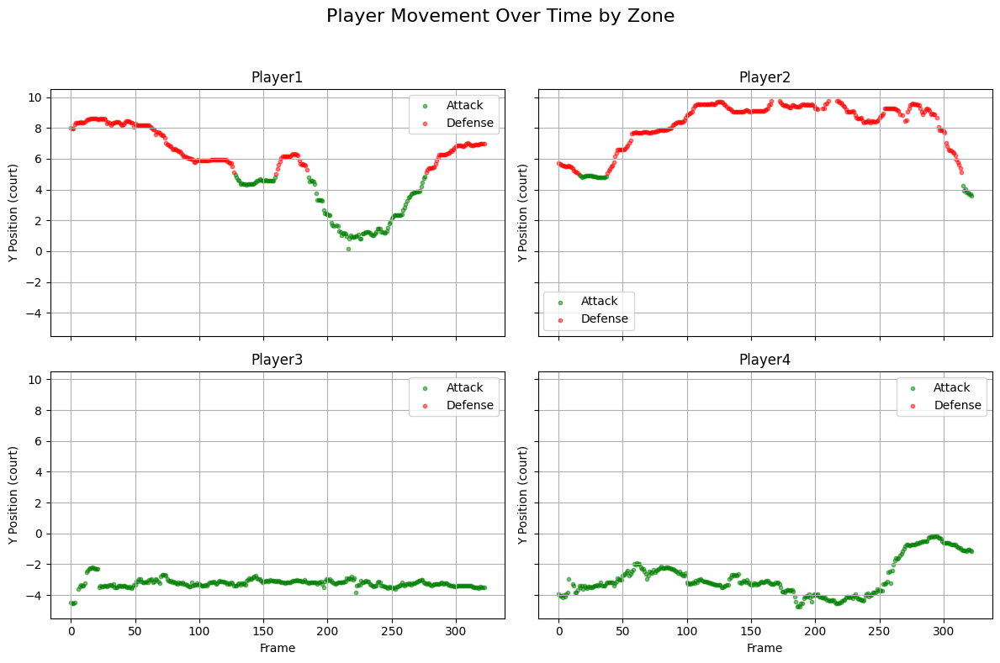

In [15]:
# Set up the figure
fig, axes = plt.subplots(2, 2, figsize=(12, 8), sharex=True, sharey=True)
fig.suptitle("Player Movement Over Time by Zone", fontsize=16)

zones = {
    "Attack": lambda y: (y >= -5) & (y <= 5),
    "Defense": lambda y: (y < -5) | (y > 5)
}

zone_colors = {
    "Attack": "green",
    "Defense": "red"
}

for i, player in enumerate(players):
    ax = axes[i // 2, i % 2]
    y_values = -players_data[f"{player}_y"]  # Flip Y direction here
    time = players_data["Frame"]

    for zone_name, condition in zones.items():
        mask = condition(players_data[f"{player}_y"])  # Use the original y for zone classification
        ax.scatter(
            time[mask],
            y_values[mask],
            color=zone_colors[zone_name],
            label=zone_name,
            alpha=0.5,
            s=10
        )

    ax.set_title(player.capitalize())
    ax.set_ylabel("Y Position (court)")
    ax.grid(True)
    ax.legend()

axes[1, 0].set_xlabel("Frame")
axes[1, 1].set_xlabel("Frame")
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


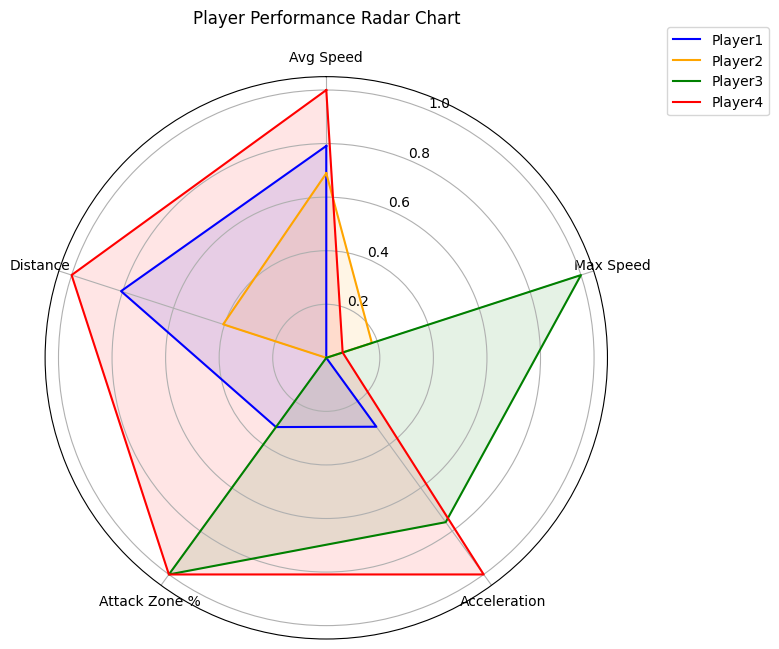

In [16]:
# 1. Set values for each player
metrics = {
    "Avg Speed": [players_data[f"{p}_Vnorm1"].mean() for p in players],
    "Max Speed": [players_data[f"{p}_Vnorm1"].max() for p in players],
    "Acceleration": [players_data[f"{p}_Anorm1"].mean() for p in players],
    "Attack Zone %": [  # Taken from previous analysis
        ((players_data[f"{p}_y"].between(-5, 5)).sum() / len(players_data)) * 100 for p in players
    ],
    "Distance": [players_data[f"{p}_distance"].sum() for p in players],
}

# 2. Normalize each metric to be on the same scale (0 to 1)
metric_names = list(metrics.keys())
values = np.array(list(metrics.values()))
normalized_values = (values - values.min(axis=1, keepdims=True)) / (
    values.max(axis=1, keepdims=True) - values.min(axis=1, keepdims=True)
)

# 3. Set up Radar Chart
labels = metric_names
num_vars = len(labels)
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]  # To close the circle

# Set up the plot
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
colors = ['blue', 'orange', 'green', 'red']

# Plot for each player
for i, player in enumerate(players):
    player_values = normalized_values[:, i].tolist()
    player_values += player_values[:1]
    ax.plot(angles, player_values, label=player.capitalize(), color=colors[i])
    ax.fill(angles, player_values, alpha=0.1, color=colors[i])

# Formatting
ax.set_theta_offset(np.pi / 2)
ax.set_theta_direction(-1)
ax.set_thetagrids(np.degrees(angles[:-1]), labels)
ax.set_title("Player Performance Radar Chart", y=1.08)
ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))
plt.tight_layout()
plt.show()


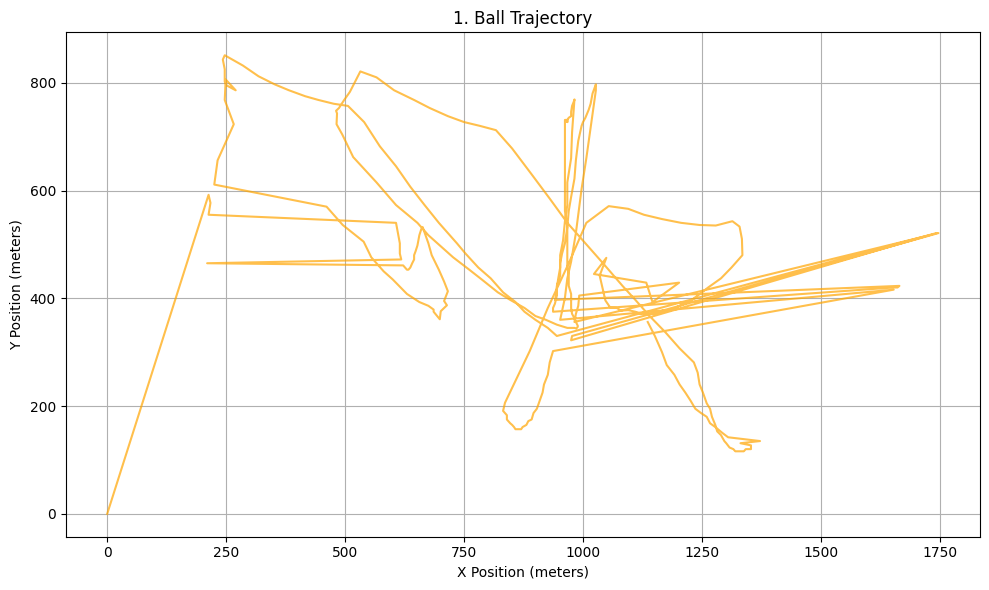

In [17]:
# Trajectory of the Ball
plt.figure(figsize=(10, 6))
plt.plot(ball_data['Ball X'], ball_data['Ball Y'], color='orange', alpha=0.7)
plt.title('1. Ball Trajectory')
plt.xlabel('X Position (meters)')
plt.ylabel('Y Position (meters)')
plt.grid(True)
plt.tight_layout()
plt.show()

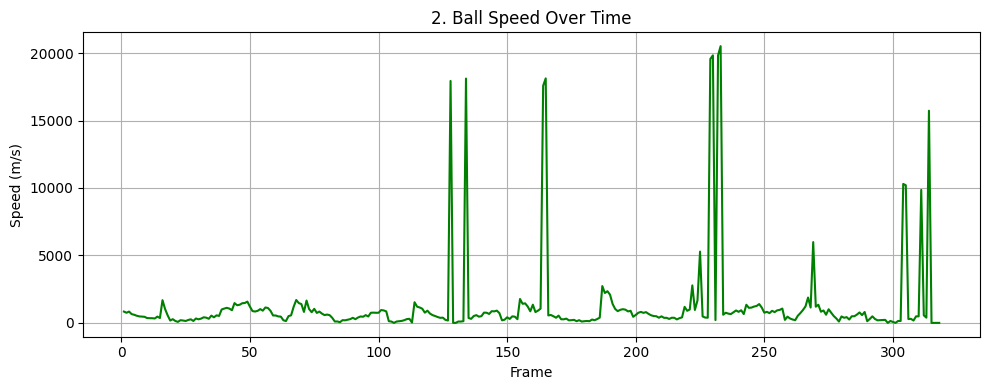

In [18]:
# Ball Speed over Time
plt.figure(figsize=(10, 4))
plt.plot(ball_data['Frame'], ball_data['Speed'], color='green')
plt.title('2. Ball Speed Over Time')
plt.xlabel('Frame')
plt.ylabel('Speed (m/s)')
plt.grid(True)
plt.tight_layout()
plt.show()


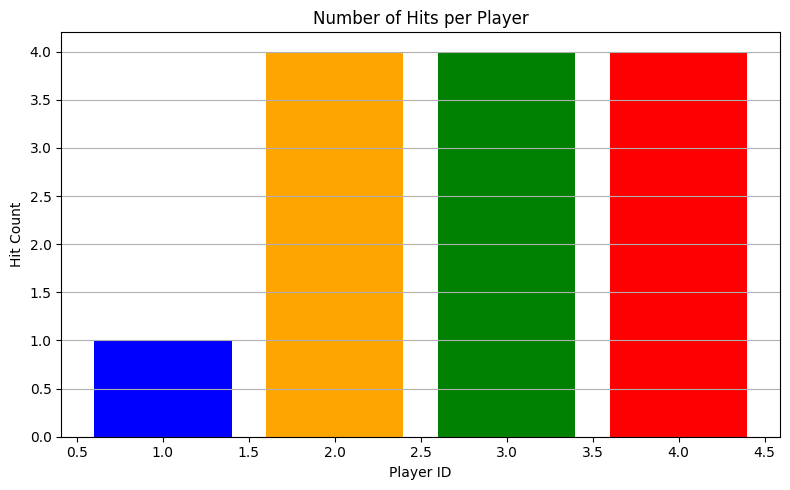

In [19]:
# Ensure required columns are present
assert 'Hit Player ID' in ball_data.columns, "'Hit Player ID' column is missing!"

# Drop rows with missing hit data
valid_hits = ball_data.dropna(subset=['Hit Player ID']).copy()
valid_hits['Hit Player ID'] = valid_hits['Hit Player ID'].astype(int)

# Count hits per player
hit_counts = valid_hits['Hit Player ID'].value_counts().sort_index()

colors = ['blue', 'orange', 'green', 'red']

# Plot hit count per player
plt.figure(figsize=(8, 5))
plt.bar(hit_counts.index, hit_counts.values, color=colors)
plt.title("Number of Hits per Player")
plt.xlabel("Player ID")
plt.ylabel("Hit Count")
plt.grid(axis='y')
plt.tight_layout()
plt.show()


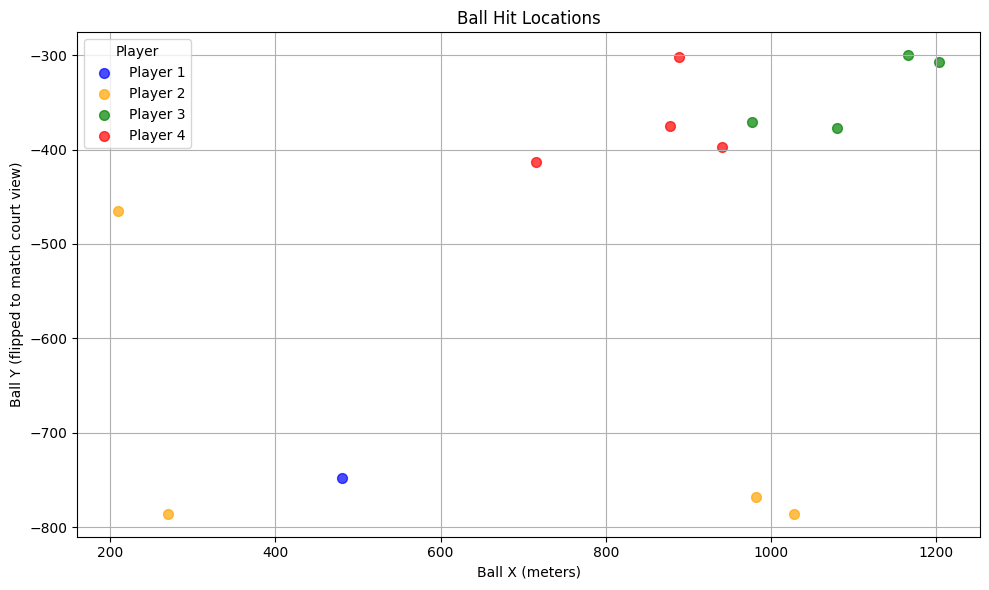

In [20]:
# Ensure required columns are present
assert 'Hit Player ID' in ball_data.columns
assert 'Ball X' in ball_data.columns
assert 'Ball Y' in ball_data.columns

# Filter only valid hit entries
hit_positions = ball_data.dropna(subset=['Hit Player ID']).copy()
hit_positions['Hit Player ID'] = hit_positions['Hit Player ID'].astype(int)

# Flip Y axis to match player orientation
hit_positions['Ball Y'] = -hit_positions['Ball Y']

# Custom colors
colors = ['blue', 'orange', 'green', 'red']
player_ids = [1, 2, 3, 4]

# Scatter plot
plt.figure(figsize=(10, 6))
for player_id, color in zip(player_ids, colors):
    player_hits = hit_positions[hit_positions['Hit Player ID'] == player_id]
    plt.scatter(
        player_hits['Ball X'],
        player_hits['Ball Y'],
        label=f'Player {player_id}',
        color=color,
        s=50,
        alpha=0.7
    )

# Plot details
plt.title("Ball Hit Locations")
plt.xlabel("Ball X (meters)")
plt.ylabel("Ball Y (flipped to match court view)")
plt.grid(True)
plt.legend(title="Player")
plt.tight_layout()
plt.show()


Top 2 Strongest Hits:
Player 4 - Speed: 18111.67 m/s
Player 2 - Speed: 10300.49 m/s


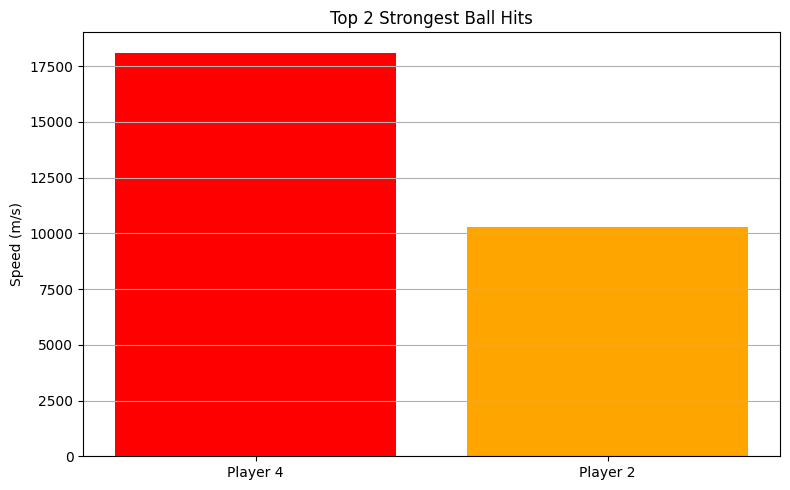

In [21]:
# Ensure required columns are present
assert 'Hit Player ID' in ball_data.columns
assert 'Speed' in ball_data.columns

# Drop rows with missing values
valid_hits = ball_data.dropna(subset=['Hit Player ID', 'Speed']).copy()
valid_hits['Hit Player ID'] = valid_hits['Hit Player ID'].astype(int)

# Get top 2 hits by speed
top_2_hits = valid_hits.nlargest(2, 'Speed')[['Hit Player ID', 'Speed']]

# Print results
print("Top 2 Strongest Hits:")
for i, row in top_2_hits.iterrows():
    print(f"Player {int(row['Hit Player ID'])} - Speed: {row['Speed']:.2f} m/s")

# Plot
plt.figure(figsize=(8, 5))
plt.bar(
    [f"Player {int(pid)}" for pid in top_2_hits['Hit Player ID']],
    top_2_hits['Speed'],
    color=['red', 'orange']
)
plt.title("Top 2 Strongest Ball Hits")
plt.ylabel("Speed (m/s)")
plt.grid(axis='y')
plt.tight_layout()
plt.show()


In [ ]:
import json
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Ensure data exists: players_data, ball_data, and player_ids
players = [f"player{i}" for i in range(1, 5)]

# 1. Player trajectories
trajectory_data = {
    player: {
        "x": players_data[f"{player}_x"].tolist(),
        "y": (-players_data[f"{player}_y"]).tolist()
    }
    for player in players
}

# 2. Frame-by-frame animation data
animated_data = []
for i in range(len(players_data)):
    frame = {"Frame": int(players_data['Frame'].iloc[i])}
    for player in players:
        frame[player] = {
            "x": float(players_data[f"{player}_x"].iloc[i]),
            "y": float(-players_data[f"{player}_y"].iloc[i])
        }
    animated_data.append(frame)

# 3. Heatmap data
heatmap_data = {
    player: {
        "x": players_data[f"{player}_x"].tolist(),
        "y": (-players_data[f"{player}_y"]).tolist()
    }
    for player in players
}

# 4. Distance and average speed
distance_total = {
    player: float(players_data[f'{player}_distance'].sum())
    for player in players
}
distance_avg = {
    player: float(players_data[f'{player}_distance'].mean())
    for player in players
}
speed_avg = {
    player: float(players_data[f'{player}_Vnorm1'].mean())
    for player in players
}

# 5. Max speed and acceleration
max_speeds = {
    player: float(players_data[f'{player}_Vnorm1'].max())
    for player in players
}
avg_accelerations = {
    player: float(players_data[f'{player}_Anorm1'].mean())
    for player in players
}

# 6. Zone presence
zones = {
    "Attack Zone": lambda y: (y >= -5) & (y <= 5),
    "Defense Zone": lambda y: (y < -5) | (y > 5),
}
zone_percentages = {zone: {player: 0 for player in players} for zone in zones}
total_frames = len(players_data)

for player in players:
    y_positions = players_data[f'{player}_y']
    for zone_name, condition in zones.items():
        count = condition(y_positions).sum()
        percentage = (count / total_frames) * 100
        zone_percentages[zone_name][player] = round(percentage, 2)

# 7. Radar performance metrics
metrics = {
    "Avg Speed": [players_data[f"{p}_Vnorm1"].mean() for p in players],
    "Max Speed": [players_data[f"{p}_Vnorm1"].max() for p in players],
    "Acceleration": [players_data[f"{p}_Anorm1"].mean() for p in players],
    "Attack Zone %": [
        ((players_data[f"{p}_y"].between(-5, 5)).sum() / len(players_data)) * 100 for p in players
    ],
    "Distance": [players_data[f"{p}_distance"].sum() for p in players],
}
radar_data = {
    "metrics": list(metrics.keys()),
    "players": {
        player: {
            metric: round(metrics[metric][i], 2)
            for metric in metrics
        }
        for i, player in enumerate(players)
    }
}


# 8. Ball trajectory
ball_trajectory = {
    "x": ball_data["Ball X"].tolist(),
    "y": ball_data["Ball Y"].tolist()
}

# 9. Ball speed over time
ball_speed_over_time = {
    "frame": ball_data["Frame"].tolist(),
    "speed": ball_data["Speed"].tolist()
}

# 10. Hit count per player
assert 'Hit Player ID' in ball_data.columns
valid_hits = ball_data.dropna(subset=['Hit Player ID']).copy()
valid_hits['Hit Player ID'] = valid_hits['Hit Player ID'].astype(int)
hit_counts = valid_hits['Hit Player ID'].value_counts().sort_index()
hit_count_per_player = {
    f"Player {pid}": int(count) for pid, count in hit_counts.items()
}

# 11. Ball hit locations
hit_positions = ball_data.dropna(subset=['Hit Player ID']).copy()
hit_positions['Hit Player ID'] = hit_positions['Hit Player ID'].astype(int)
ball_hit_locations = {
    f"Player {pid}": {
        "x": hit_positions[hit_positions["Hit Player ID"] == pid]["Ball X"].tolist(),
        "y": hit_positions[hit_positions["Hit Player ID"] == pid]["Ball Y"].tolist()
    } for pid in [1, 2, 3, 4]
}

# 12. Top 2 strongest hits
top_2_hits = valid_hits.nlargest(2, 'Speed')[['Hit Player ID', 'Speed']]
top_2_strongest_hits = [
    {
        "player": int(row["Hit Player ID"]),
        "speed": round(row["Speed"], 2)
    } for _, row in top_2_hits.iterrows()
]

# Merge all into a single JSON
visualization_json = {
    "trajectories": trajectory_data,
    "animation": animated_data,
    "heatmaps": heatmap_data,
    "distance_total": distance_total,
    "distance_avg_per_frame": distance_avg,
    "average_speed": speed_avg,
    "max_speed": max_speeds,
    "average_acceleration": avg_accelerations,
    "zone_presence_percentages": zone_percentages,
    "radar_performance": radar_data,
    "ball_trajectory": ball_trajectory,
    "ball_speed_over_time": ball_speed_over_time,
    "hit_count_per_player": hit_count_per_player,
    "ball_hit_locations": ball_hit_locations,
    "top_2_strongest_hits": top_2_strongest_hits
}

# Save JSON
with open("player_visualization_data.json", "w") as f:
    json.dump(visualization_json, f, indent=2)

print("All player and ball analyses saved to 'players_and_ball_visualization_cache.json'")


All player and ball analyses saved to 'players_and_ball_visualization_data.json'
